# MD-DTW Analysis Framework  for cep290 analysis

## Setup: Configure Environment and Import Functions

In [6]:
import os

os.chdir(os.environ['MORPHSEQ_REPO_ROOT']) 

import pandas as pd

# Import MD-DTW analysis tools
from src.analyze.trajectory_analysis import (
    # Step 2: Array preparation
    prepare_multivariate_array,


    # Step 3: Distance computation
    compute_md_dtw_distance_matrix,

    # Step 4: Outlier detection
    identify_outliers,
    remove_outliers_from_distance_matrix,

    # Step 5: Clustering & visualization (NEW API)
    generate_dendrograms,
    add_cluster_column,
    run_bootstrap_hierarchical,
    analyze_bootstrap_results,
    plot_multimetric_trajectories,
    plot_trajectories_faceted,
    PASTEL_COLORS,

    # K-SELECTION PIPELINE (Phase 1) - SEPARATE FUNCTIONS for granular control
    evaluate_k_range,              # Evaluate multiple k values with metrics
    plot_k_selection,              # Visualize k comparison across all metrics
    classify_membership_2d,        # Core/uncertain/outlier classification

    # Consensus clustering (Phase 2)
    run_consensus_pipeline,        # Full two-stage pipeline
)

from src.analyze.trajectory_analysis.facetted_plotting import plot_proportion_grid
from src.analyze.trajectory_analysis.facetted_plotting import plot_proportion_faceted

# Re-import with new K-medoids functionality
from src.analyze.trajectory_analysis import (
    run_k_selection_with_plots,
    run_bootstrap_kmedoids,
    run_bootstrap_hierarchical,
)

# Import add_membership_column from k_selection module directly
from src.analyze.trajectory_analysis.k_selection import add_membership_column

from src.analyze.trajectory_analysis import plot_dendrogram_with_categories

# For loading data
from src.analyze.trajectory_analysis import extract_trajectories_df

from src.analyze.trajectory_analysis import compute_trajectory_distances

from pathlib import Path
results_dir = "results/mcolon/20251219_b9d2_phenotype_extraction"
plot_dir = Path("/net/trapnell/vol1/home/mdcolon/proj/morphseq/results/mcolon/20251219_b9d2_phenotype_extraction/plots")
plot_dir.mkdir(parents=True, exist_ok=True)

print("✓ Imports successful!")

✓ Imports successful!


## Step 1: Load and Filter Data

Load your trajectory data as a long-format DataFrame with columns:
- `embryo_id`: Unique identifier for each embryo
- `predicted_stage_hpf`: Time in hours post fertilization
- Metric columns (e.g., `baseline_deviation_normalized`, `total_length_um`, etc.)
- Optional: `genotype`, `pair`, or other categorical columns for visualization

In [3]:
# Example: Load your data
# Replace this with your actual data loading code

# Option 1: Load from CSV
# df = pd.read_csv('path/to/your/data.csv')

#Option 2: Use existing data loading utilities

from src.analyze.trajectory_analysis.data_loading import load_experiment_dataframe
# List all experiments you want to analyze together
experiment_ids = ['20250512','20251017_combined','20251106', '20251112', '20251113', '20251205','20251212']  # Add your experiment IDs

# Load and combine
dfs = []
for exp_id in experiment_ids:
    df_exp = load_experiment_dataframe(exp_id, format_version='df03')
    df_exp['experiment_id'] = exp_id  # Track which experiment each row came from
    dfs.append(df_exp)
    print(f"✓ Loaded {exp_id}: {len(df_exp)} rows, {df_exp['embryo_id'].nunique()} embryos")

# Concatenate all experiments
df = pd.concat(dfs, ignore_index=True)

print(f"\n✓ Combined data: {len(df)} rows, {df['embryo_id'].nunique()} embryos")
print(f"  Experiments: {df['experiment_id'].unique()}")

df = df.loc[df["genotype"].str.contains("cep290", na=False)]

df.loc[df["pair"].isna(), "pair"] = "cep290_spawn"

df["pair"].value_counts(dropna=False)



  Loading curvature from: /net/trapnell/vol1/home/mdcolon/proj/morphseq/morphseq_playground/metadata/body_axis/summary/curvature_metrics_20250512.csv
  Loading metadata from: /net/trapnell/vol1/home/mdcolon/proj/morphseq/morphseq_playground/metadata/build06_output/df03_final_output_with_latents_20250512.csv
    Curvature: 18720 rows
    Metadata: 9089 rows
    ⚠️  Column divergence detected: ['baseline_deviation_um', 'total_length_um']
    📌 Suffixing: curvature keeps original, metadata gets '_meta'
    Merged on 'snip_id': 9089 rows
    Unique snip_ids: curvature=18720, metadata=9089, merged=9089
    ⚠️  9631 snip_ids only in curvature (dropped)
✓ Loaded 20250512: 9089 rows, 88 embryos
  Loading curvature from: /net/trapnell/vol1/home/mdcolon/proj/morphseq/morphseq_playground/metadata/body_axis/summary/curvature_metrics_20251017_combined.csv
  Loading metadata from: /net/trapnell/vol1/home/mdcolon/proj/morphseq/morphseq_playground/metadata/build06_output/df03_final_output_with_latents

pair
cep290_spawn                  24840
cep290_pair_1                  4719
cep290_pair_2                  4528
cep290_pair_3                  4514
cep290_pair_1_F_pair_2_M       3684
cep290_pair_2_F_pair_1_M       2050
cep290_pair_2_F_pair_2-1_M      896
cep290_pair_4_F_pair_3_M        536
Name: count, dtype: int64

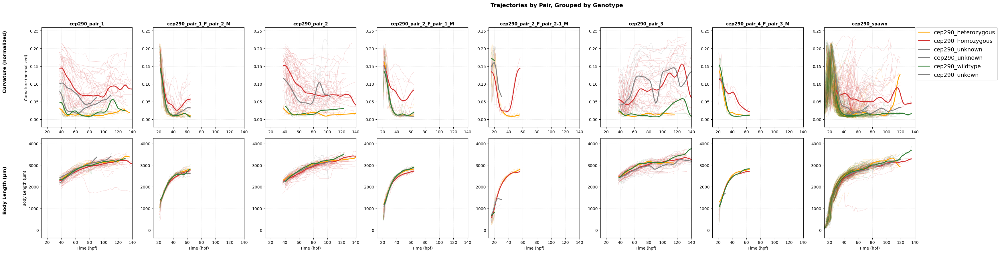

In [4]:
plot_dir = Path('results/mcolon/20251229_cep290_phenotype_extraction/general_plots')
plot_dir.mkdir(parents=True, exist_ok=True)
    # Optional: Color by genotype instead to validate clusters separate genotypes
    
fig_by_genotype = plot_multimetric_trajectories(
        df,
        metrics=['baseline_deviation_normalized', 'total_length_um'],
        col_by='pair',
        color_by_grouping='genotype',  # NEW API: groups AND colors by genotype
        x_col='predicted_stage_hpf',
        metric_labels={
            'baseline_deviation_normalized': 'Curvature (normalized)',
            'total_length_um': 'Body Length (μm)',
        },
        title='Trajectories by Pair, Grouped by Genotype',
        x_label='Time (hpf)',
        backend='both',
        bin_width=2.0,
        output_path=plot_dir / 'cep290_trajectories_by_pair_grouped_by_genotype.png'
    )



/tmp/6100406.1.trapnell-short.q/ipykernel_3446693/465277054.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  d.groupby([experiment_col, "hpf_bin"])[embryo_col]


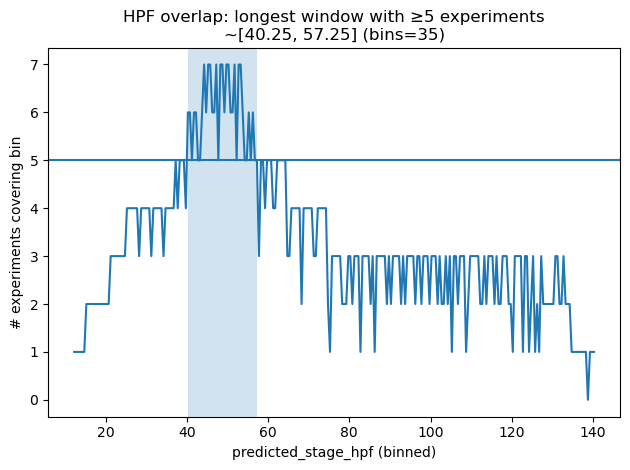

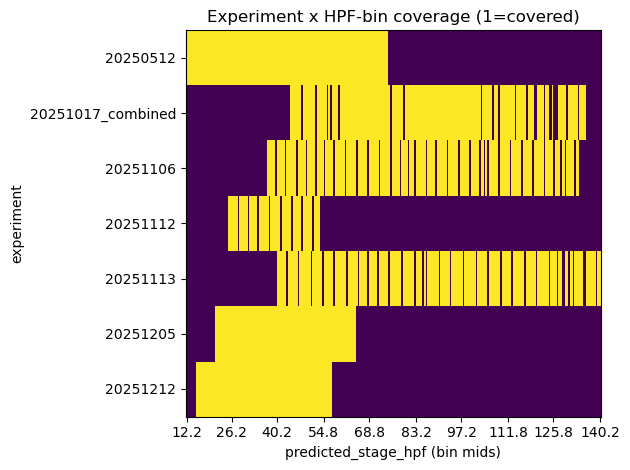

Suggested overlap window: 40.25 57.25


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def experiment_hpf_coverage(
    df,
    experiment_col="experiment_id",
    hpf_col="predicted_stage_hpf",
    embryo_col="embryo_id",
    bin_width=0.5,
    min_embryos_per_bin=1,
    hpf_min=None,
    hpf_max=None,
):
    """
    Returns:
      bins_mid: (B,) bin midpoints
      cover_df: (E,B) boolean coverage matrix (True if experiment has >= min_embryos_per_bin embryos in bin)
      cov_count: (B,) number of experiments covering each bin
    """
    d = df[[experiment_col, hpf_col, embryo_col]].dropna().copy()
    d[hpf_col] = pd.to_numeric(d[hpf_col], errors="coerce")
    d = d.dropna(subset=[hpf_col])

    if hpf_min is None:
        hpf_min = float(d[hpf_col].min())
    if hpf_max is None:
        hpf_max = float(d[hpf_col].max())

    # Nice binning
    start = np.floor(hpf_min / bin_width) * bin_width
    end = np.ceil(hpf_max / bin_width) * bin_width
    edges = np.arange(start, end + bin_width, bin_width)

    d["hpf_bin"] = pd.cut(d[hpf_col], bins=edges, include_lowest=True, right=False)

    # Count unique embryos per (experiment, bin) to avoid overweighting dense time sampling
    counts = (
        d.groupby([experiment_col, "hpf_bin"])[embryo_col]
         .nunique()
         .unstack(fill_value=0)
    )

    cover_df = (counts >= min_embryos_per_bin)
    # Ensure all bins present (sometimes cut can drop empty bins if nothing lands there)
    cover_df = cover_df.reindex(columns=pd.IntervalIndex(pd.cut(edges[:-1], edges, right=False)), fill_value=False)

    cov_count = cover_df.sum(axis=0).to_numpy()

    # Bin midpoints for plotting
    bins_mid = np.array([(iv.left + iv.right) / 2 for iv in cover_df.columns])

    return bins_mid, cover_df, cov_count


def longest_interval_where(cov_count, bins_mid, min_experiments=5):
    """
    Find the longest contiguous interval (in bins) where cov_count >= min_experiments.
    Returns (hpf_start, hpf_end, n_bins) or (None, None, 0) if none found.
    """
    ok = cov_count >= min_experiments
    if not ok.any():
        return None, None, 0

    # find runs of True
    idx = np.where(ok)[0]
    # split where gaps > 1
    splits = np.where(np.diff(idx) > 1)[0] + 1
    runs = np.split(idx, splits)

    # choose run with max length
    best = max(runs, key=len)
    hpf_start = bins_mid[best[0]]
    hpf_end = bins_mid[best[-1]]
    return float(hpf_start), float(hpf_end), int(len(best))


def plot_hpf_overlap_quick(
    bins_mid,
    cov_count,
    cover_df=None,
    min_experiments=5,
    show_heatmap=True,
    max_experiments_heatmap=80,
    title_prefix="HPF overlap",
):
    hpf_start, hpf_end, n_bins = longest_interval_where(cov_count, bins_mid, min_experiments=min_experiments)

    # Coverage line plot
    plt.figure()
    plt.plot(bins_mid, cov_count)
    plt.axhline(min_experiments)
    if hpf_start is not None:
        plt.axvspan(hpf_start, hpf_end, alpha=0.2)
        plt.title(f"{title_prefix}: longest window with ≥{min_experiments} experiments\n"
                  f"~[{hpf_start:.2f}, {hpf_end:.2f}] (bins={n_bins})")
    else:
        plt.title(f"{title_prefix}: no window with ≥{min_experiments} experiments")
    plt.xlabel("predicted_stage_hpf (binned)")
    plt.ylabel("# experiments covering bin")
    plt.tight_layout()
    plt.show()

    # Heatmap (optional)
    if show_heatmap and cover_df is not None:
        hm = cover_df
        if hm.shape[0] > max_experiments_heatmap:
            # keep most “complete” experiments so it stays readable
            order = hm.sum(axis=1).sort_values(ascending=False).index[:max_experiments_heatmap]
            hm = hm.loc[order]

        plt.figure()
        plt.imshow(hm.to_numpy().astype(int), aspect="auto", interpolation="nearest")
        plt.yticks(range(hm.shape[0]), hm.index.astype(str))
        plt.xticks(
            ticks=np.linspace(0, len(bins_mid)-1, num=min(10, len(bins_mid))).astype(int),
            labels=[f"{bins_mid[i]:.1f}" for i in np.linspace(0, len(bins_mid)-1, num=min(10, len(bins_mid))).astype(int)],
            rotation=0,
        )
        plt.xlabel("predicted_stage_hpf (bin mids)")
        plt.ylabel("experiment")
        plt.title("Experiment x HPF-bin coverage (1=covered)")
        plt.tight_layout()
        plt.show()

    return hpf_start, hpf_end


# ---- usage ----
bins_mid, cover_df, cov_count = experiment_hpf_coverage(
    df,
    experiment_col="experiment_id",
    hpf_col="predicted_stage_hpf",
    embryo_col="embryo_id",
    bin_width=0.5,
    min_embryos_per_bin=3,   # raise this if you want “real” support per bin
)
hpf_start, hpf_end = plot_hpf_overlap_quick(
    bins_mid, cov_count, cover_df=cover_df, min_experiments=5, show_heatmap=True
)
print("Suggested overlap window:", hpf_start, hpf_end)

## K-SELECTION PIPELINE: Two-Phase Clustering with Membership Quality Assessment

This section integrates the two-phase k-selection pipeline to enable interactive exploration of optimal k and identification of phenotypic clusters.

# More targeted clustering
so i saw batch efffects by expirmmnt due to massively dfferent time ranges, im going to subset to 40 to 60 where the phenotype trend is very clear and most experiments (if not all) have data during that time. 
additionally i incread sed the sakoe chiba radius to 10 to allow for more warping since we are only looking at a small time window now



In [5]:
from importlib import reload
import src.analyze.trajectory_analysis.dtw_distance as dtw_module
reload(dtw_module)
from src.analyze.trajectory_analysis import compute_trajectory_distances

# Define which metrics to use
metrics = ['baseline_deviation_normalized']

# Compute distances using the wrapper function
D_30_80, embryo_ids_30_80, time_grid_30_80 = compute_trajectory_distances(
    df,
    metrics=metrics,
    time_col='predicted_stage_hpf',
    time_window=(30.0, 80.0),  # Use the overlapping time window
    embryo_id_col='embryo_id',
    normalize=True,  # Z-score normalization (recommended)
    sakoe_chiba_radius=20,  # Warping constraint (3 is good default)
    verbose=True
)


COMPUTE TRAJECTORY DISTANCES

1. Filtering to time window: [30.0, 80.0] predicted_stage_hpf
   Embryos before: 635
   Embryos after: 571
            (no data in time window)

2. Preparing multivariate array
   Metrics: ['baseline_deviation_normalized']
   Normalize: True
Preparing multivariate array for 1 metrics...
  Metrics: ['baseline_deviation_normalized']
  Normalization: True
  Embryos: 571

Interpolating 1 metrics to common grid (step=0.5)
  Interpolated multi-metric shape: (34727, 4)
  Time points: 100 (30.1 - 79.6 hpf)
  Array shape: (571, 100, 1)
  Before normalization:
    baseline_deviation_normalized: mean=0.049, std=0.051
  After normalization:
    baseline_deviation_normalized: mean=-0.000000, std=1.000000
✓ Multivariate array prepared successfully

   Array shape: (571, 100, 1) (embryos × timepoints × metrics)
   Time grid: [30.1, 79.6] (100 points)

3. Computing MD-DTW distances
   Sakoe-Chiba radius: 20
Computing MD-DTW distance matrix...
  Embryos: 571
  Array shape:

In [1]:
# Check what's happening
import os
print(f"os.cpu_count(): {os.cpu_count()}")
print(f"sched_getaffinity: {len(os.sched_getaffinity(0))}")

# Check NSLOTS environment variable (SGE sets this)
print(f"NSLOTS: {os.environ.get('NSLOTS', 'not set')}")


os.cpu_count(): 192
sched_getaffinity: 16
NSLOTS: 8


In [6]:
plot_dir = Path('results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-80hpf')
# Remove outliers and create clean distance matrix for Phase 1
D_filtered_30_80, embryo_ids_filtered_30_80, filtering_stats_30_80 = remove_outliers_from_distance_matrix(
    D_30_80,
    embryo_ids_30_80,
    outlier_detection_method='iqr',
    outlier_threshold=2.0,
    verbose=True
)
 
print("✓ run_bootstrap_kmedoids imported successfully")

# Test 2: Run k-selection with K-medoids
# Assuming you have: df, D (distance matrix), embryo_ids already defined
k_results_kmedoids_30_60 = run_k_selection_with_plots(
    df=df,
    D=D_30_80,
    embryo_ids=embryo_ids_30_80,
    output_dir=Path('results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-80hpf'),
    k_range=[2, 3, 4, 5,6,7],  # Start small for testing
    n_bootstrap=100,      # Fewer iterations for quick test
    method='kmedoids',   # NEW!
    verbose=True
)



Identifying outliers using 'iqr' method...
  Total embryos: 571
  Q1 (25th percentile): 36.952
  Q3 (75th percentile): 104.873
  IQR: 67.922
  IQR multiplier: 2.0×
  Threshold (Q3 + 2.0×IQR): 240.717
  Threshold: 240.717
  Outliers detected: 16
  Inliers retained: 555

  Outlier embryos:
    20250512_C06_e01: median_dist = 318.291
    20250512_F02_e01: median_dist = 243.467
    20251106_D03_e01: median_dist = 306.298
    20251106_F05_e01: median_dist = 242.704
    20251106_F09_e01: median_dist = 252.456
    20251113_C03_e01: median_dist = 262.429
    20251113_D02_e01: median_dist = 260.819
    20251113_D06_e01: median_dist = 267.173
    20251113_F05_e01: median_dist = 293.038
    20251113_G03_e01: median_dist = 312.270
    20251113_G06_e01: median_dist = 245.692
    20251113_H05_e01: median_dist = 243.881
    20251212_A10_e01: median_dist = 270.903
    20251212_C04_e01: median_dist = 256.312
    20251212_C07_e01: median_dist = 332.033
    20251212_E05_e01: median_dist = 291.802

✓ Out

In [7]:
# Add this function to your notebook (or later to k_selection.py)


def plot_cluster_flow(
    results,
    k_range=None,
    title="Cluster Flow Across k Values",
    output_path=None,
    color_palette=None,
):
    """
    Create a Sankey diagram showing how clusters split as k increases.
    
    Parameters
    ----------
    results : Dict
        Output from run_k_selection_with_plots() or evaluate_k_range().
        Must contain 'clustering_by_k' with assignments for each k.
    k_range : List[int], optional
        Which k values to include. If None, uses all available k values.
    title : str
        Plot title.
    output_path : Path, optional
        If provided, saves the plot as HTML.
    color_palette : List[str], optional
        Colors for clusters.
    
    Returns
    -------
    plotly.graph_objects.Figure
    
    Examples
    --------
    >>> fig = plot_cluster_flow(results, k_range=[2, 3, 4, 5])
    >>> fig.show()
    """
    import plotly.graph_objects as go
    
    clustering_by_k = results['clustering_by_k']
    
    # Determine k values to use
    if k_range is None:
        k_range = sorted(clustering_by_k.keys())
    else:
        k_range = [k for k in k_range if k in clustering_by_k]
    
    if len(k_range) < 2:
        raise ValueError("Need at least 2 k values to create a flow diagram")
    
    # Default color palette
    if color_palette is None:
        color_palette = [
            "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
            "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
            "#aec7e8", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
        ]
    
    def hex_to_rgba(hex_color, alpha=0.5):
        hex_color = hex_color.lstrip('#')
        r, g, b = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
        return f"rgba({r}, {g}, {b}, {alpha})"
    
    # Build node labels and indices
    node_labels = []
    node_colors = []
    node_index = {}  # Maps (k, cluster_id) -> index
    
    for k in k_range:
        cluster_to_embryos = clustering_by_k[k]['assignments']['cluster_to_embryos']
        n_clusters = len(cluster_to_embryos)
        for c in range(n_clusters):
            idx = len(node_labels)
            node_index[(k, c)] = idx
            n_embryos = len(cluster_to_embryos.get(c, []))
            node_labels.append(f"k={k}: C{c} (n={n_embryos})")
            node_colors.append(color_palette[c % len(color_palette)])
    
    # Build links (flows between consecutive k values)
    sources = []
    targets = []
    values = []
    link_colors = []
    
    for i in range(len(k_range) - 1):
        k_from = k_range[i]
        k_to = k_range[i + 1]
        
        # Get cluster assignments for both k values
        assignments_from = clustering_by_k[k_from]['assignments']['embryo_to_cluster']
        assignments_to = clustering_by_k[k_to]['assignments']['embryo_to_cluster']
        
        # Count embryos flowing from each cluster at k_from to each cluster at k_to
        flow_counts = {}  # (cluster_from, cluster_to) -> count
        
        for embryo_id, cluster_from in assignments_from.items():
            if embryo_id in assignments_to:
                cluster_to = assignments_to[embryo_id]
                key = (cluster_from, cluster_to)
                flow_counts[key] = flow_counts.get(key, 0) + 1
        
        # Add links
        for (cluster_from, cluster_to), count in flow_counts.items():
            sources.append(node_index[(k_from, cluster_from)])
            targets.append(node_index[(k_to, cluster_to)])
            values.append(count)
            link_colors.append(hex_to_rgba(color_palette[cluster_from % len(color_palette)], 0.5))
    
    # Create Sankey figure
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=node_labels,
            color=node_colors,
        ),
        link=dict(
            source=sources,
            target=targets,
            value=values,
            color=link_colors,
        )
    )])
    
    fig.update_layout(
        title_text=title,
        font_size=12,
        height=400 + 50 * len(k_range),
        width=250 * len(k_range),
    )
    
    if output_path:
        from pathlib import Path
        fig.write_html(str(output_path))
        print(f"✓ Saved cluster flow diagram: {output_path}")
    
    return fig


# Usage in your notebook:
fig = plot_cluster_flow(
    k_results_kmedoids_30_60,
    # k_range=[2, 3, 4, 5, 6],
    title="cep290 Cluster Flow: How Clusters Split as k Increases",
    output_path=plot_dir / "cluster_flow_sankey.html"
)
fig.show()

✓ Saved cluster flow diagram: results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-80hpf/cluster_flow_sankey.html


note, look how cluster 0  stays stable from reclsterins,  this is the NP (non ptrant) cluster. ill choose k=6 as this seems to split up the data very well. also it minimized hthe outliers, like k=2.
im findingthat the porpotion of loutliers is actualy the better way of finding ideal k, as apposed to silhouette score and the like. 

In [8]:
choosen_k = 5

embryo_to_cluster = k_results_kmedoids_30_60['clustering_by_k'][choosen_k]['assignments']['embryo_to_cluster']


cluster_to_embryos = k_results_kmedoids_30_60['clustering_by_k'][choosen_k]['assignments']['cluster_to_embryos']


df['cluster_on_all_data'] = df['embryo_id'].map(embryo_to_cluster)



embryo_to_cluster = k_results_kmedoids_30_60['clustering_by_k'][6]['assignments']['embryo_to_cluster']


cluster_to_embryos = k_results_kmedoids_30_60['clustering_by_k'][6]['assignments']['cluster_to_embryos']


df['cluster_on_all_data_k6'] = df['embryo_id'].map(embryo_to_cluster)





genotype
cep290_homozygous      20709
cep290_heterozygous    11815
cep290_wildtype         7886
cep290_unknown          5357
Name: count, dtype: int64


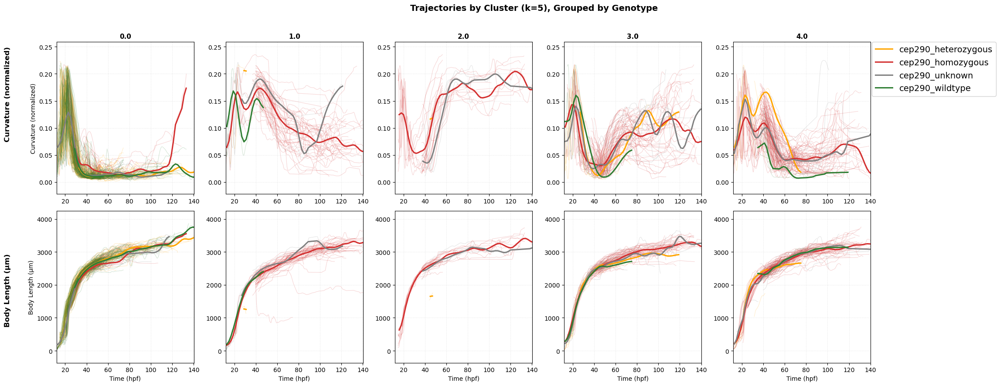

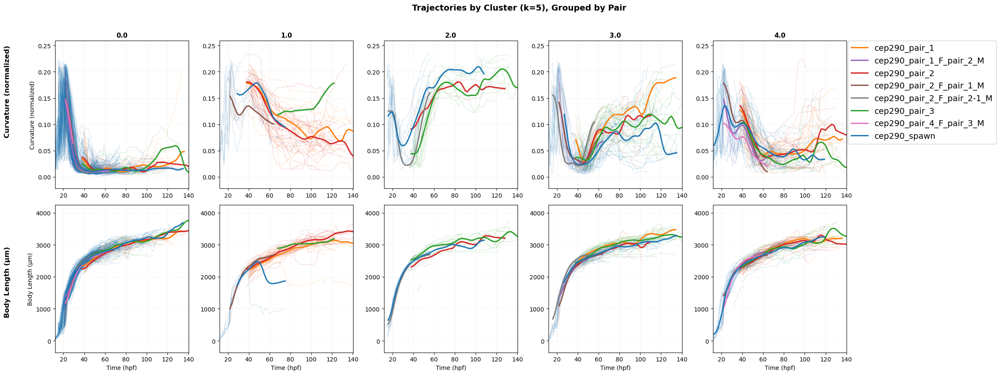

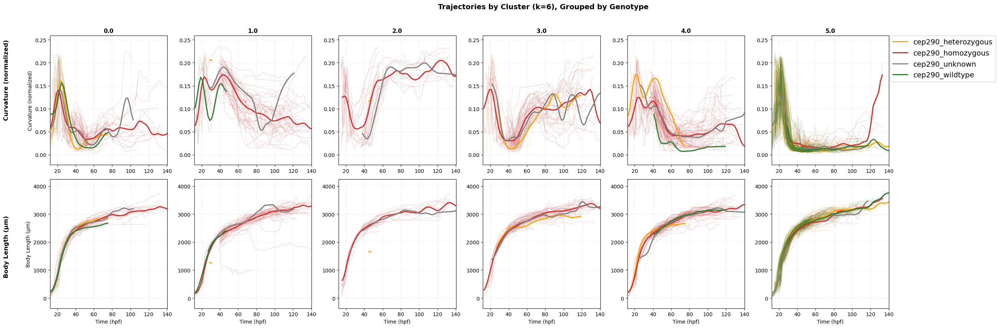

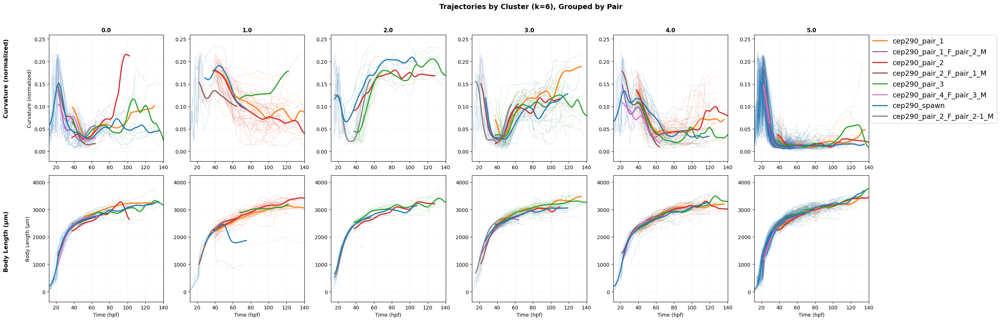

In [10]:
# Count embryos per cluster
import sys

modules_to_remove = [
    'src.analyze.trajectory_analysis',
    'src.analyze.trajectory_analysis.facetted_plotting',
]
for module in list(sys.modules.keys()):
    if module.startswith('src.analyze.trajectory_analysis'):
        del sys.modules[module]

# Re-import
from src.analyze.trajectory_analysis.facetted_plotting import plot_multimetric_trajectories


plot_dir = Path("results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-80hpf")

df.loc[df["genotype"].str.contains("unk", na=False), "genotype"] = "cep290_unknown"

print(df["genotype"].value_counts())

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data',
    color_by_grouping='genotype',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k={choosen_k}), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_genotype_k5.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data',
    color_by_grouping='pair',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k={choosen_k}), Grouped by Pair',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_pair_k5.html'
)


fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data_k6"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data_k6',
    color_by_grouping='genotype',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_genotype_k6.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data_k6"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data_k6',
    color_by_grouping='pair',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Pair',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_pair_k6.html'
)

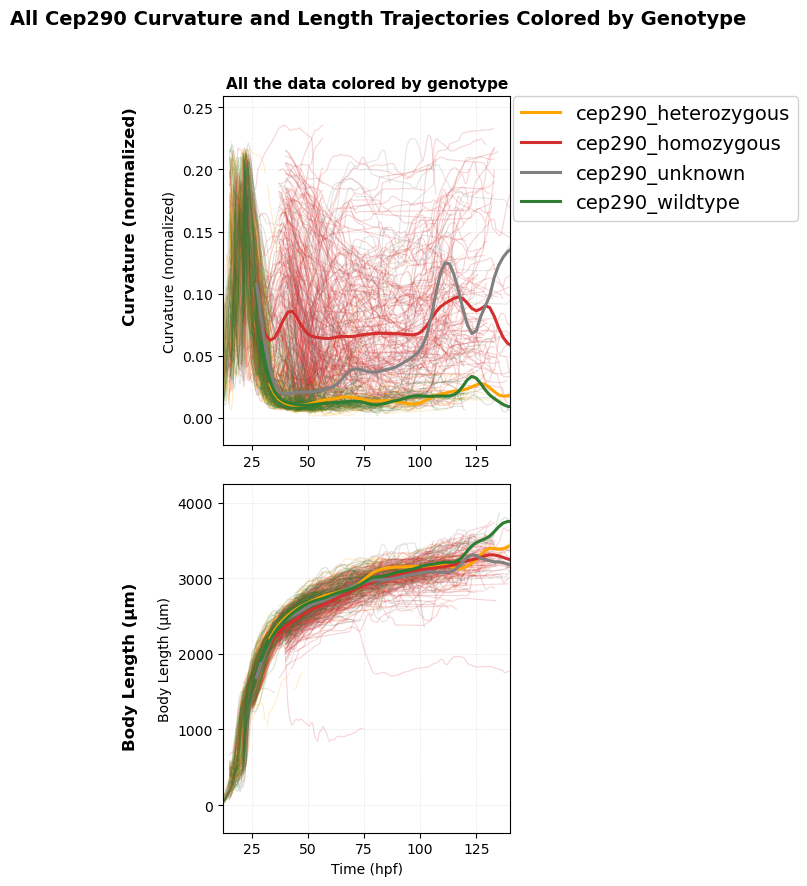

In [11]:
df["all_the_data_colored_by_genotype"] = "All the data colored by genotype"

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data_k6"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='all_the_data_colored_by_genotype',
    color_by_grouping='genotype',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'All Cep290 Curvature and Length Trajectories Colored by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_all_curvature_genotype.html'
)

{'plotly': Figure({
     'data': [{'hoverinfo': 'skip',
               'line': {'width': 0},
               'mode': 'lines',
               'showlegend': False,
               'type': 'scatter',
               'x': {'bdata': ('AAAAAACAKEAAAAAAAIApQAAAAAAAgC' ... 'AAAAAQXEAAAAAAADBcQAAAAAAAUF5A'),
                     'dtype': 'f8'},
               'xaxis': 'x',
               'y': {'bdata': ('n3iSiSWErz/IKxXXkcCzPzt5sDZ7J7' ... 'Gak0kukz8g4Y7dZEWSP9UEmnSnqZU/'),
                     'dtype': 'f8'},
               'yaxis': 'y'},
              {'fill': 'tonexty',
               'fillcolor': 'rgba(255,165,0,0.2)',
               'hoverinfo': 'skip',
               'line': {'width': 0},
               'mode': 'lines',
               'showlegend': False,
               'type': 'scatter',
               'x': {'bdata': ('AAAAAACAKEAAAAAAAIApQAAAAAAAgC' ... 'AAAAAQXEAAAAAAADBcQAAAAAAAUF5A'),
                     'dtype': 'f8'},
               'xaxis': 'x',
               'y': {'bdata': ('UCyAC

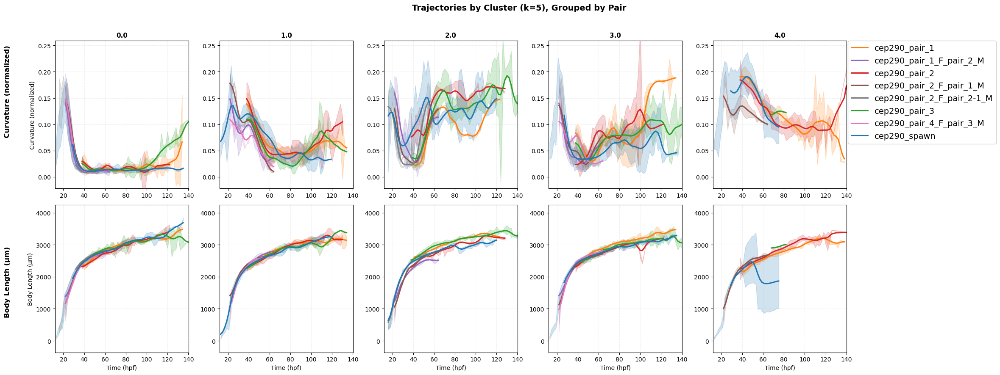

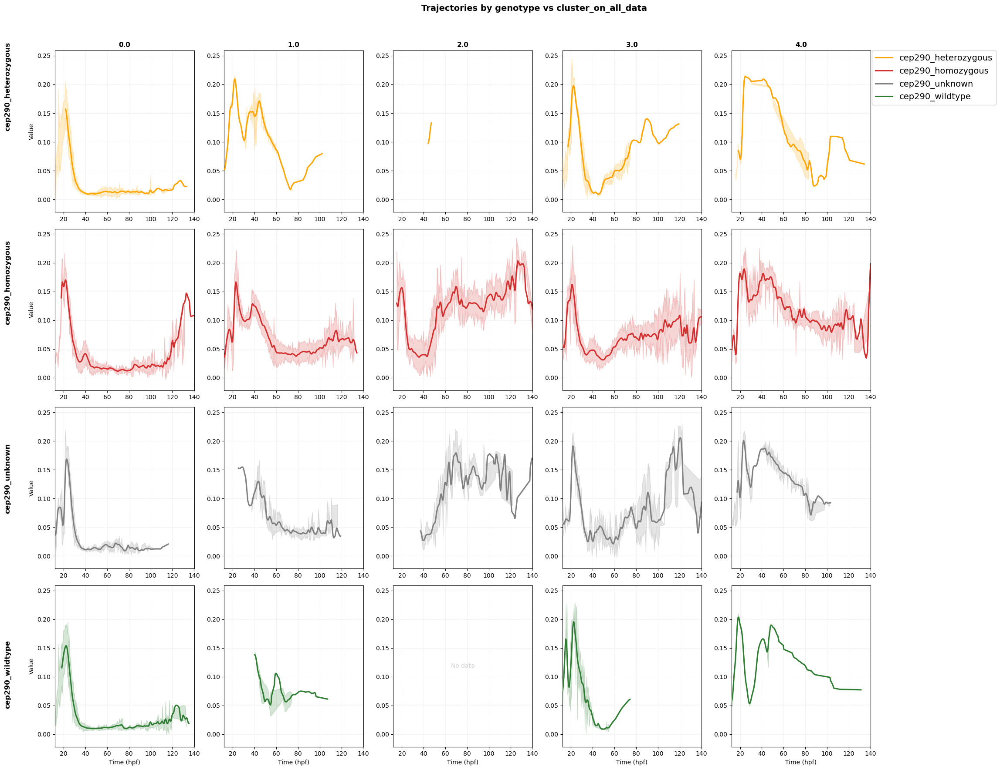

In [9]:
# Count embryos per cluster
import sys

modules_to_remove = [
    'src.analyze.trajectory_analysis',
    'src.analyze.trajectory_analysis.facetted_plotting',
]
for module in list(sys.modules.keys()):
    if module.startswith('src.analyze.trajectory_analysis'):
        del sys.modules[module]

# Re-import
from src.analyze.trajectory_analysis.facetted_plotting import plot_multimetric_trajectories

fig = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data',
    color_by_grouping='pair',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k={choosen_k}), Grouped by Pair',
    x_label='Time (hpf)',
    backend='both',
    show_individual=False,
    show_error_band=True,
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_pair.html'
)


df.loc[df["genotype"].str.contains("unk"), "genotype"] = "cep290_unknown"
plot_trajectories_faceted(
    df[~df["cluster_on_all_data"].isna()],
    y_col="baseline_deviation_normalized",
    row_by="genotype",
    col_by="cluster_on_all_data",
    color_by_grouping="genotype",
    backend='both',
    show_individual=False,
    show_error_band=True,
    output_path=plot_dir / "cep290_curvature_by_penetrant_clusterXgenotype_trajectories_variance_spread.html",
)


In [15]:
plot_dir

PosixPath('results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-60hpf-ss-radius-20')

## RECLUSTERING: 0 and 3 need to be reclusted because i believe later trends are dominatng, spome embryos from 3 need to go to 0 thsose wavy clusters are from cluster 0 actualy 

In [15]:
df_0_3 = df[df['cluster_on_all_data_k6'].isin([0,3])]

In [16]:
# Compute distances using the wrapper function
D_0_3, embryo_ids_0_3, time_grid_0_3 = compute_trajectory_distances(
    df_0_3,
    metrics=metrics,
    time_col='predicted_stage_hpf',
    time_window=(40.0, 50.0),  # Use the overlapping time window
    embryo_id_col='embryo_id',
    normalize=True,  # Z-score normalization (recommended)
    sakoe_chiba_radius=20,  # Warping constraint (3 is good default)
        verbose=True
    )

k_results_kmedoids_30_60 = run_k_selection_with_plots(
    df=df_0_3,
    D=D_0_3,
    embryo_ids=embryo_ids_0_3,
    output_dir=Path('results/mcolon/20251229_cep290_phenotype_extraction/kmedoids_k_selection_all_cep290_data_30-80hpf/reclustering_clusters_0_and_3'),
    k_range=[2, 3, 4],  # Start small for testing
    n_bootstrap=100,      # Fewer iterations for quick test
    method='kmedoids',   # NEW!
    verbose=True
)

COMPUTE TRAJECTORY DISTANCES

1. Filtering to time window: [40.0, 50.0] predicted_stage_hpf
   Embryos before: 115
   Embryos after: 105
            (no data in time window)

2. Preparing multivariate array
   Metrics: ['baseline_deviation_normalized']
   Normalize: True
Preparing multivariate array for 1 metrics...
  Metrics: ['baseline_deviation_normalized']
  Normalization: True
  Embryos: 105

Interpolating 1 metrics to common grid (step=0.5)
  Interpolated multi-metric shape: (1627, 4)
  Time points: 20 (40.0 - 49.5 hpf)
  Array shape: (105, 20, 1)
  Before normalization:
    baseline_deviation_normalized: mean=0.039, std=0.026
  After normalization:
    baseline_deviation_normalized: mean=-0.000000, std=1.000000
✓ Multivariate array prepared successfully

   Array shape: (105, 20, 1) (embryos × timepoints × metrics)
   Time grid: [40.0, 49.5] (20 points)

3. Computing MD-DTW distances
   Sakoe-Chiba radius: 20
Computing MD-DTW distance matrix...
  Embryos: 105
  Array shape: (105

In [ ]:
embryo_to_cluster = k_results_kmedoids_30_60['clustering_by_k'][2]['assignments']['embryo_to_cluster']


df["cluster_on_all_data_k6_reclustered"] = df['cluster_on_all_data_k6']
cluster_mapping = {0: 0, 1: 3}
mask = df['embryo_id'].isin(embryo_to_cluster.keys())
#This preserves clusters 1 and 2 from the original assignment, and only overwrites with the new 0→0 and 1→3 mapping for embryos present in embryo_to_cluster.
df.loc[mask, "cluster_on_all_data_k6_reclustered"] = df.loc[mask, 'embryo_id'].map(embryo_to_cluster).map(cluster_mapping)

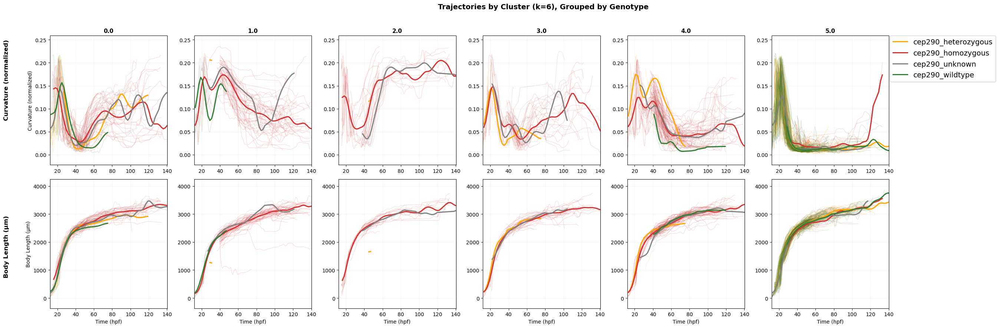

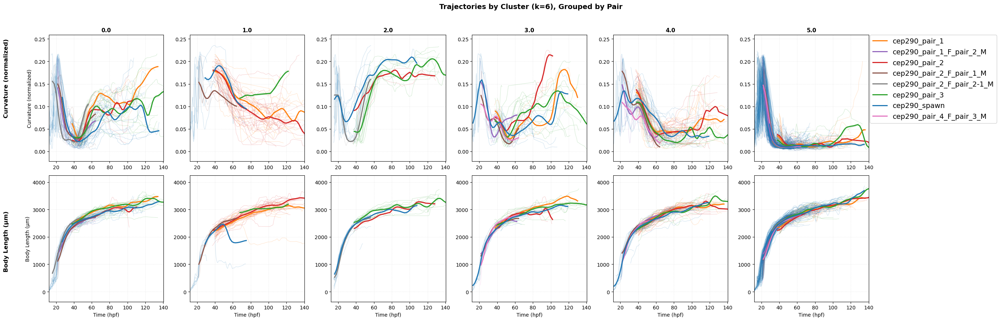

In [19]:
fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data_k6_reclustered"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data_k6_reclustered',
    color_by_grouping='genotype',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_genotype_k6_0n3_reclustered.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster_on_all_data_k6_reclustered"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_on_all_data_k6_reclustered',
    color_by_grouping='pair',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Pair',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_pair_k6_0n3_reclustered.html'
)

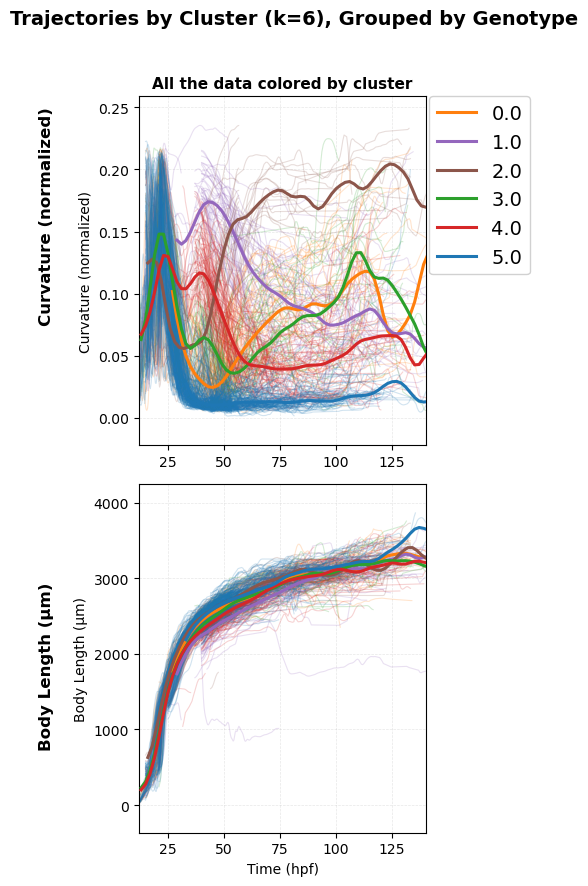

In [ ]:
df["all_the_data_colored_by_cluster"] = "All the data colored by cluster"


fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='all_the_data_colored_by_cluster',
    color_by_grouping='cluster',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_by_genotype_k6_colored_by_cluster_reclustered.html'
)

df["all_the_data_colored_by_cluster"] = "All the data colored by cluster"



In [2]:
import pickle
from pathlib import Path

# Load the pickle file
data_dir = Path("results/mcolon/20251229_cep290_phenotype_extraction/data")
with open(data_dir / 'clustering_data_full_30_80.pkl', 'rb') as f:
    data = pickle.load(f)

# Extract all the saved data
D_30_80 = data['D_cep290']
D_filtered_30_80 = data['D_cep290_filtered']
embryo_ids_30_80 = data['embryo_ids_cep290']
embryo_ids_filtered_30_80 = data['embryo_ids_cep290_filtered']
time_grid_30_80 = data['time_grid_cep290']
metrics = data['metrics_cep290']
df = data['df_cep290']
filtering_stats_30_80 = data['filtering_data']

print(f"Loaded dataframe with {len(df)} rows and {len(df.columns)} columns")
print(f"Columns: {df.columns.tolist()}")

Loaded dataframe with 45767 rows and 303 columns
Columns: ['snip_id', 'total_length_um', 'mean_curvature_per_um', 'std_curvature_per_um', 'max_curvature_per_um', 'n_centerline_points', 'baseline_deviation_um', 'max_baseline_deviation_um', 'baseline_deviation_std_um', 'arc_length_ratio', 'arc_length_um', 'chord_length_um', 'keypoint_deviation_q1_um', 'keypoint_deviation_mid_um', 'keypoint_deviation_q3_um', 'curvature_success', 'processing_time_s', 'image_id', 'embryo_id', 'frame_index', 'area_px', 'bbox_x_min', 'bbox_y_min', 'bbox_x_max', 'bbox_y_max', 'mask_confidence', 'mask_rle', 'mask_height_px', 'mask_width_px', 'exported_mask_path', 'image_path', 'experiment_id', 'video_id', 'is_seed_frame', 'height_um', 'height_px', 'width_um', 'width_px', 'bf_channel', 'objective', 'raw_time_s', 'relative_time_s', 'well_qc_flag', 'well', 'time_int', 'time_string', 'sam2_qc_flags', 'well_id', 'experiment_date', 'pair', 'nd2_series_num', 'microscope', 'Height (um)', 'Width (um)', 'Height (px)', 'W

In [6]:
df["clusters"] = df["cluster_on_all_data_k6_reclustered"]

In [7]:
import os

# Define cluster labels
cluster_names_k6 = {
    0: 'Low_to_High',
    1: 'High_to_Low',  # Actually two groups
    2: 'Low_to_High',
    3: 'Intermediate',
    4: 'High_to_Low',
    5: 'Not Penetrant'
}

cluster_names_k_subcategories = {
    0: 'Low_to_High_A',
    1: 'High_to_Low_A',
    2: 'Low_to_High_B',
    3: 'Intermediate',
    4: 'High_to_Low_B',
    5: 'Not Penetrant'
}

# Create new columns with labels
df["cluster_categories"] = df["clusters"].map(cluster_names_k6)
df["cluster_subcategories"] = df["clusters"].map(cluster_names_k_subcategories)

# Create output directory
output_dir = "results/mcolon/20251229_cep290_phenotype_extraction/final_data"
os.makedirs(output_dir, exist_ok=True)

# Save the full dataframe
df.to_csv(f"{output_dir}/embryo_data_with_labels.csv", index=False)

# Also save just the labels
labels_df = df[['embryo_id', 'cluster_categories', 'cluster_subcategories','clusters']].copy()
labels_df.to_csv(f"{output_dir}/embryo_cluster_labels.csv", index=False)

In [28]:
# # Create new columns with labels

# Create output directory
import pickle
# Create output directory
data_dir = Path('results/mcolon/20251229_cep290_phenotype_extraction/data')
data_dir.mkdir(parents=True, exist_ok=True)

df["cluster"] = df["cluster_on_all_data_k6_reclustered"]

# Save everything in one comprehensive pickle file
with open(data_dir / 'clustering_data_full_30_80.pkl', 'wb') as f:
    pickle.dump({
        # Distance matrix & array
        'D_cep290': D_30_80,
        'D_cep290_filtered': D_filtered_30_80,
        'embryo_ids_cep290': embryo_ids_30_80,
        'embryo_ids_cep290_filtered': embryo_ids_filtered_30_80,
        'time_grid_cep290': time_grid_30_80,
        'metrics_cep290': metrics,
        
        # Trajectory DataFrame (most important!)
        'df_cep290': df,
        'filtering_data':filtering_stats_30_80 
    }, f)


### lets look at proportions of pairs and genotypes in each cluster to see if this makes sense

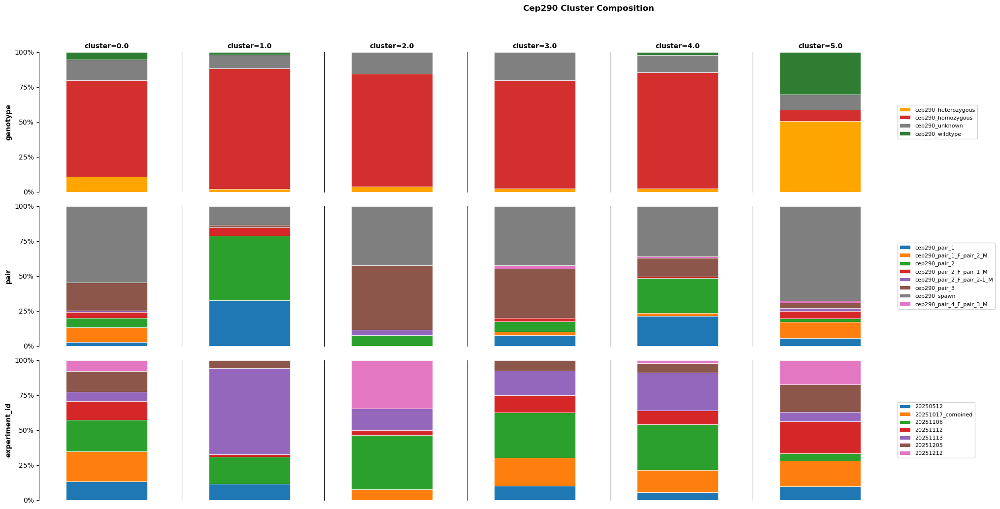

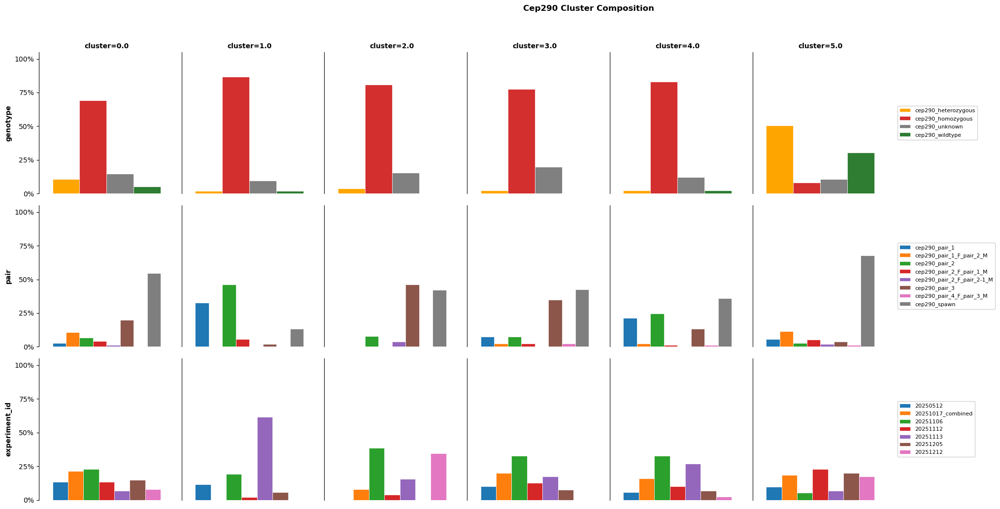

In [ ]:
# Reload
import sys
for module in list(sys.modules.keys()):
    if module.startswith('src.analyze.trajectory_analysis'):
        del sys.modules[module]

from src.analyze.trajectory_analysis.facetted_plotting import plot_proportion_grid

# Stacked (default)
fig_stacked = plot_proportion_grid(
    df[~df["cluster"].isna()],
    col_by='cluster',
    row_by=['genotype', 'pair', 'experiment_id'],
    count_by='embryo_id',
    bar_mode='stacked',
    title=f'Cep290 Cluster Composition',
    output_path=plot_dir / 'cluster_composition_stacked.png',
)

# Grouped (side-by-side)
fig_grouped = plot_proportion_grid(
    df[~df["cluster"].isna()],
    col_by='cluster',
    row_by=['genotype', 'pair', 'experiment_id'],
    count_by='embryo_id',
    bar_mode='grouped',
    title=f'Cep290 Cluster Composition',
    output_path=plot_dir / 'cluster_composition_grouped.png',
)


# reload finalized data object 

In [2]:
import pandas as pd

df = pd.read_csv('results/mcolon/20251229_cep290_phenotype_extraction/final_data/embryo_data_with_labels.csv')

/tmp/6231437.1.trapnell-login.q/ipykernel_1553345/283444277.py:3: DtypeWarning: Columns (31,48) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('results/mcolon/20251229_cep290_phenotype_extraction/final_data/embryo_data_with_labels.csv')


In [11]:
list(df.columns[~df.columns.str.contains('z_')])

['snip_id',
 'total_length_um',
 'mean_curvature_per_um',
 'std_curvature_per_um',
 'max_curvature_per_um',
 'n_centerline_points',
 'baseline_deviation_um',
 'max_baseline_deviation_um',
 'baseline_deviation_std_um',
 'arc_length_ratio',
 'arc_length_um',
 'chord_length_um',
 'keypoint_deviation_q1_um',
 'keypoint_deviation_mid_um',
 'keypoint_deviation_q3_um',
 'curvature_success',
 'processing_time_s',
 'image_id',
 'embryo_id',
 'frame_index',
 'area_px',
 'bbox_x_min',
 'bbox_y_min',
 'bbox_x_max',
 'bbox_y_max',
 'mask_confidence',
 'mask_rle',
 'mask_height_px',
 'mask_width_px',
 'exported_mask_path',
 'image_path',
 'experiment_id',
 'video_id',
 'is_seed_frame',
 'height_um',
 'height_px',
 'width_um',
 'width_px',
 'bf_channel',
 'objective',
 'raw_time_s',
 'relative_time_s',
 'well_qc_flag',
 'well',
 'time_int',
 'time_string',
 'sam2_qc_flags',
 'well_id',
 'experiment_date',
 'pair',
 'nd2_series_num',
 'microscope',
 'Height (um)',
 'Width (um)',
 'Height (px)',
 'Widt

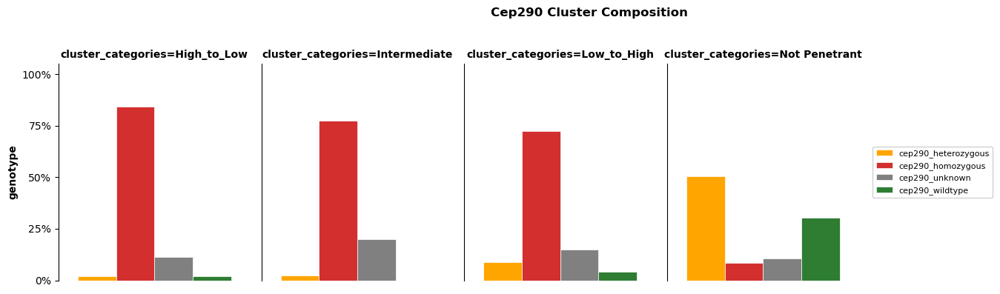

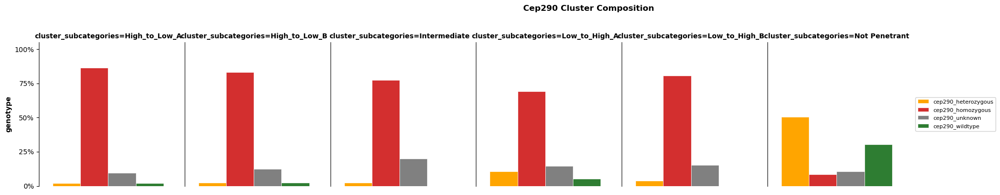

In [12]:
plot_dir = Path('results/mcolon/20251229_cep290_phenotype_extraction/plots_20260107_labmeeting')

os.makedirs(plot_dir, exist_ok=True)

# Grouped (side-by-side)
fig_grouped = plot_proportion_grid(
    df[~df["cluster"].isna()],
    col_by='cluster_categories',
    row_by=['genotype'],
    count_by='embryo_id',
    bar_mode='grouped',
    title=f'Cep290 Cluster Composition',
    output_path=plot_dir / 'cluster_genotype_composition_grouped.png',
)

# Grouped (side-by-side)
fig_grouped = plot_proportion_grid(
    df[~df["cluster"].isna()],
    col_by='cluster_subcategories',
    row_by=['genotype'],
    count_by='embryo_id',
    bar_mode='grouped',
    title=f'Cep290 Cluster Composition',
    output_path=plot_dir / 'cluster_subcategories_genotype_composition_grouped.png',
)


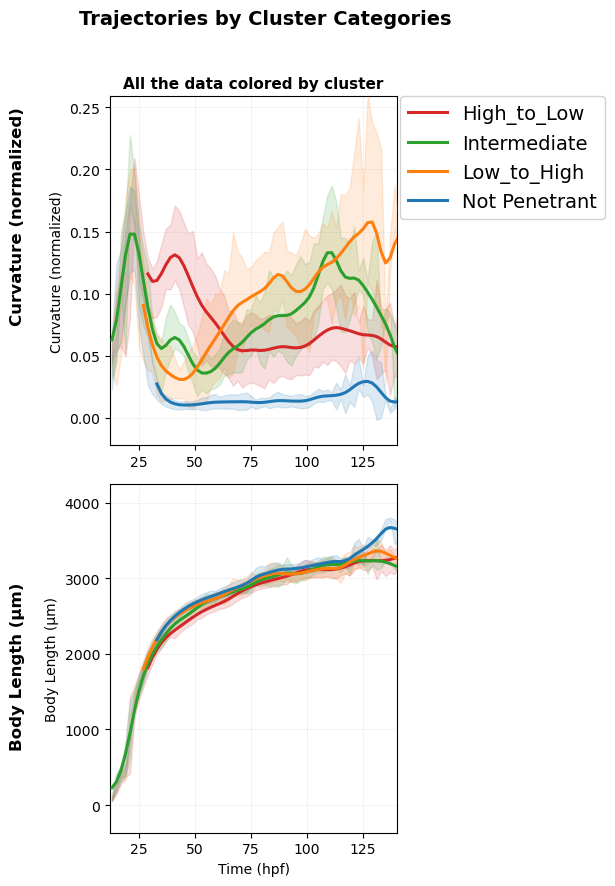

In [13]:
  fig_by_genotype = plot_multimetric_trajectories(
      df[~df["cluster"].isna()],
      metrics=['baseline_deviation_normalized', 'total_length_um'],
      col_by='all_the_data_colored_by_cluster',
      color_by_grouping='cluster_categories',
      x_col='predicted_stage_hpf',
      metric_labels={
          'baseline_deviation_normalized': 'Curvature (normalized)',
          'total_length_um': 'Body Length (μm)',
      },
      title='Trajectories by Cluster Categories',
      x_label='Time (hpf)',
      backend='both',
      bin_width=2.0,
      show_individual=False,
      show_error_band=True,
      error_band_alpha=0.15,
      output_path=plot_dir / 'cep290_cluster_trajectories_colored_by_category_errorbars.html'
  )

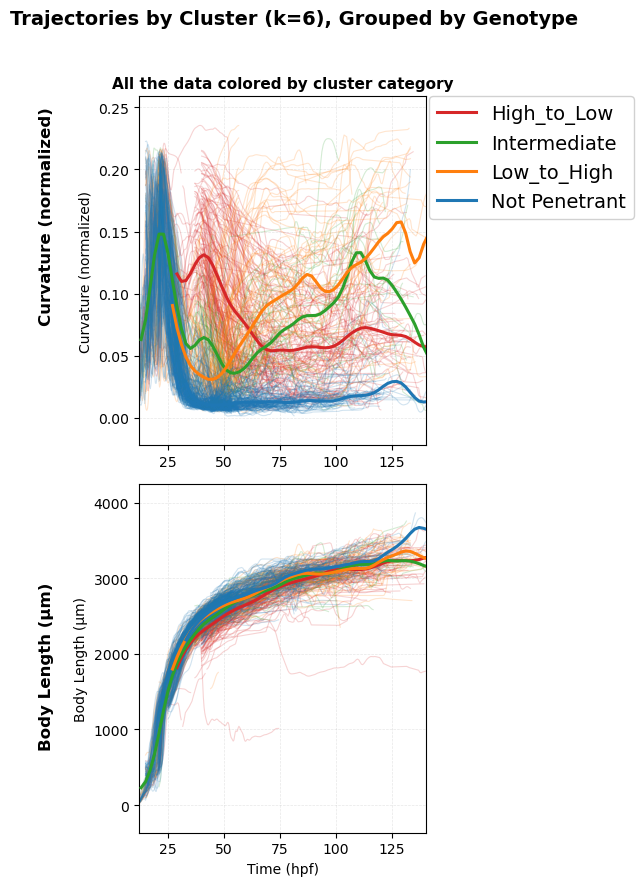

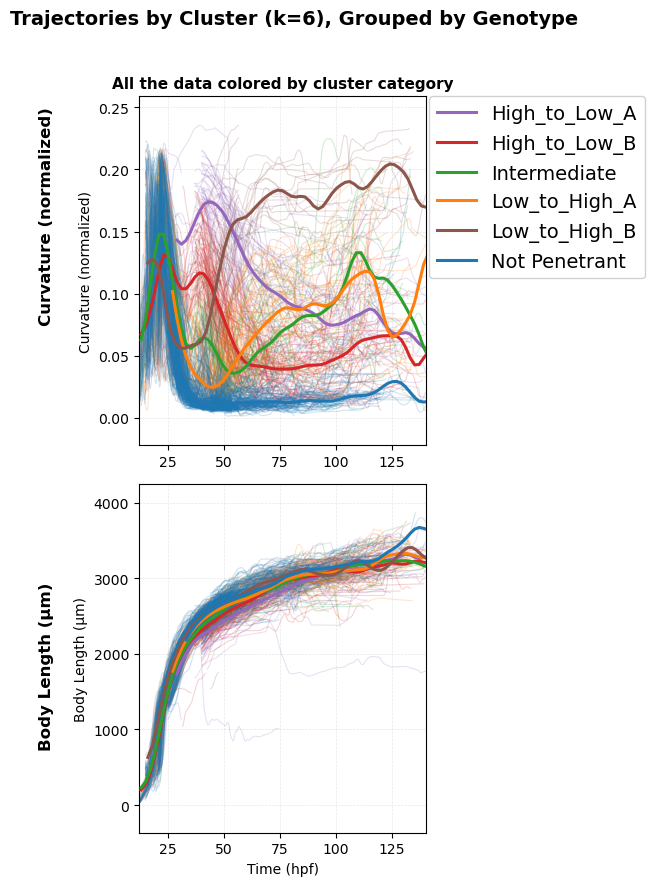

In [ ]:
df["all_the_data_colored_by_cluster"] = "All the data colored by cluster category"

# Create new columns with labels
# df["cluster_categories"] = df["clusters"].map(cluster_names_k6)
# df["cluster_subcategories"] = df["clusters"].map(cluster_names_k_subcategories)


fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='all_the_data_colored_by_cluster',
    color_by_grouping='cluster_categories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_colored_by_cluster_category.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='all_the_data_colored_by_cluster',
    color_by_grouping='cluster_subcategories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_colored_by_cluster_subcategory.html'
)





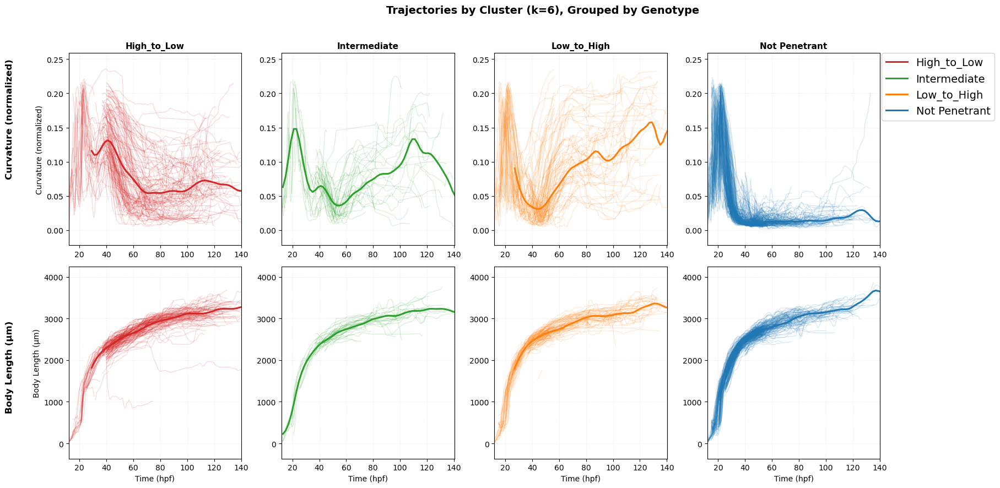

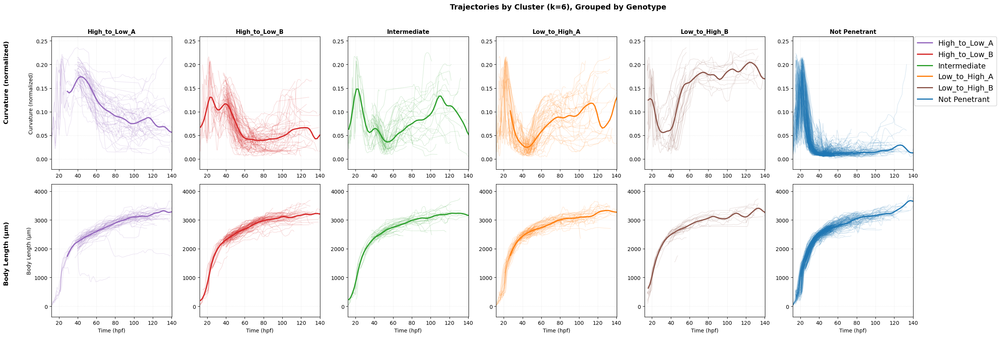

In [5]:

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_categories',
    color_by_grouping='cluster_categories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_colby_colored_by_cluster_category.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_subcategories',
    color_by_grouping='cluster_subcategories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_colby_colored_by_cluster_subcategory.html'
)


## loking at pair experimtn results 

In [36]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd

# Define ordering (most important!)
PHENOTYPE_ORDER = ["High_to_Low", 'Intermediate' , 'Low_to_High', 'Not Penetrant']

cmap = plt.cm.tab10
# Convert to hex strings for Plotly compatibility
PHENOTYPE_COLORS = {
    'Not Penetrant': mcolors.to_hex(cmap(0)),   # Blue
    'Low_to_High': mcolors.to_hex(cmap(1)),     # Orange  
    'Intermediate': mcolors.to_hex(cmap(2)),    # Green
    'High_to_Low': mcolors.to_hex(cmap(3)),     # Red
}
# Convert to ordered palette list
PHENOTYPE_PALETTE = [PHENOTYPE_COLORS[cat] for cat in PHENOTYPE_ORDER]

# To enforce ordering in your dataframe (recommended):
df["cluster_categories"] = pd.Categorical(
    df["cluster_categories"], 
    categories=PHENOTYPE_ORDER, 
    ordered=True
)

In [28]:
df_clusters = df[~df["cluster"].isna()]

df_pairs_1to3 = df_clusters[df_clusters["pair"].isin(['cep290_pair_1', 'cep290_pair_2', 'cep290_pair_3'])]

df_pairs_1to3["experiment_id"] = df_pairs_1to3["experiment_id"].astype(str)


/tmp/6231437.1.trapnell-login.q/ipykernel_1553345/3037301489.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
PHENOTYPE_PALETTE
PHENOTYPE_COLORS

{'Not Penetrant': '#1f77b4',
 'Low_to_High': '#ff7f0e',
 'Intermediate': '#2ca02c',
 'High_to_Low': '#d62728'}

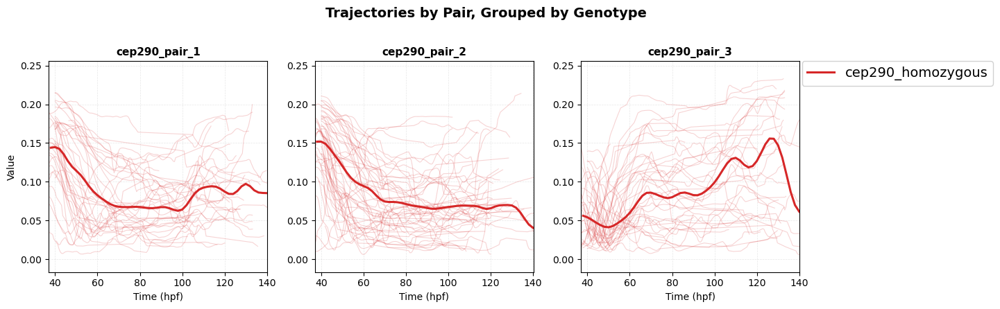

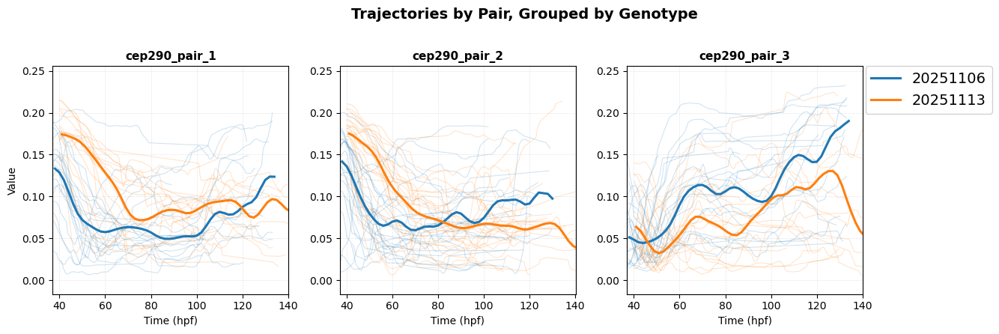

In [43]:
import sys
for m in list(sys.modules): 
    if m.startswith('src.analyze.trajectory_analysis'): 
        del sys.modules[m]

# Re-import
from src.analyze.trajectory_analysis.facetted_plotting import plot_multimetric_trajectories, plot_trajectories_faceted, plot_proportion_faceted


fig_by_genotype = plot_trajectories_faceted(
    df_pairs_1to3[df_pairs_1to3["genotype"].str.contains("homozygous")],
    x_col='predicted_stage_hpf',
    y_col='baseline_deviation_normalized',
    col_by='pair',
    row_by="genotype",
    color_by_grouping='genotype',  # NEW API
    color_palette=PHENOTYPE_PALETTE,
    title=f'Trajectories by Pair, Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_pairs_1to3_trajectories_colby_colored_homozygous_only.html'
)

fig_by_genotype = plot_trajectories_faceted(
    df_pairs_1to3[df_pairs_1to3["genotype"].str.contains("homozygous")],
    x_col='predicted_stage_hpf',
    y_col='baseline_deviation_normalized',
    col_by='pair',
    row_by="genotype",
    color_by_grouping='experiment_id',  # NEW API
    title=f'Trajectories by Pair, Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_pairs_1to3_trajectories_colby_colored_homozygous_only_experiment_id.html'
)
# )

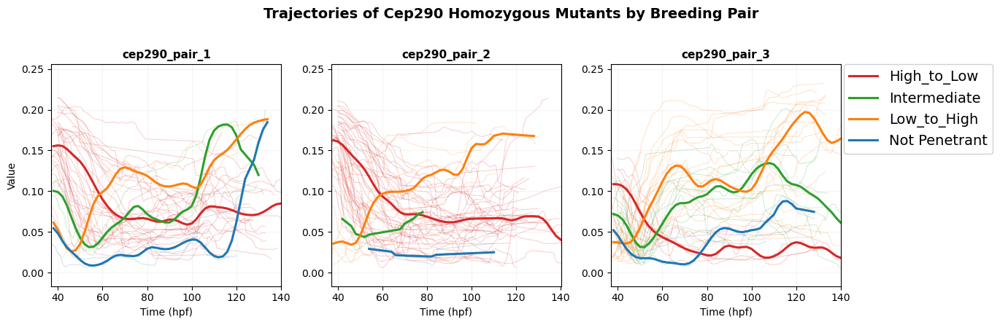

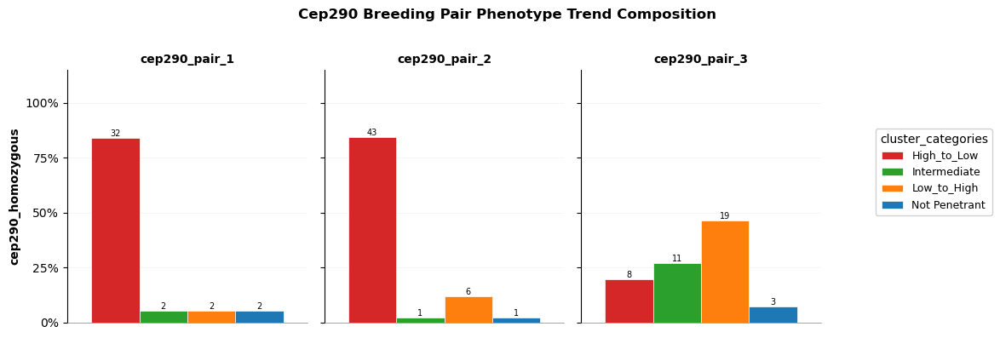

In [48]:

fig_by_genotype = plot_trajectories_faceted(
    df_pairs_1to3[df_pairs_1to3["genotype"].str.contains("homozygous")],
    x_col='predicted_stage_hpf',
    y_col='baseline_deviation_normalized',
    col_by='pair',
    row_by="genotype",
    color_by_grouping='cluster_categories',  # NEW API
    color_palette=PHENOTYPE_PALETTE,
    title=f'Trajectories of Cep290 Homozygous Mutants by Breeding Pair',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_pairs_1to3_trajectories_colby_colored_homozygous_only_cluster_categories.html'
)

fig_proportion_grid = plot_proportion_faceted(
    df_pairs_1to3[df_pairs_1to3["genotype"].str.contains("homozygous")],
    color_by_grouping= "cluster_categories",
    color_palette=PHENOTYPE_PALETTE,
    row_by= "genotype",
    col_by= "pair",
    count_by= 'embryo_id',
    output_path = plot_dir / 'cep290_pairs_1to3_homozygous_only_proportion_grid_by_curvature_phenotype_trend.png',
    title = "Cep290 Breeding Pair Phenotype Trend Composition"
)

In [ ]:
df_clusters = df[~df["cluster"].isna()]

# df_clusters["pair"].unique()

df_pair_swap = df_clusters[df_clusters["pair"].isin(['cep290_pair_1_F_pair_2_M', 'cep290_pair_2_F_pair_1_M'])]


df_pair_swap["cluster_categories"].unique()

# To enforce ordering in your dataframe (recommended):
df_pair_swap["cluster_categories"] = pd.Categorical(
    df_pair_swap["cluster_categories"], 
    categories=PHENOTYPE_ORDER, 
    ordered=True
)



/tmp/6231437.1.trapnell-login.q/ipykernel_1553345/13477521.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



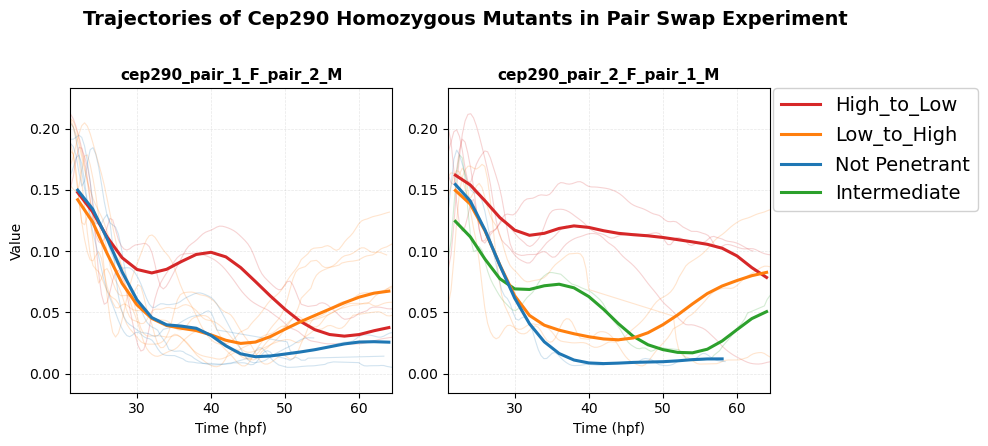

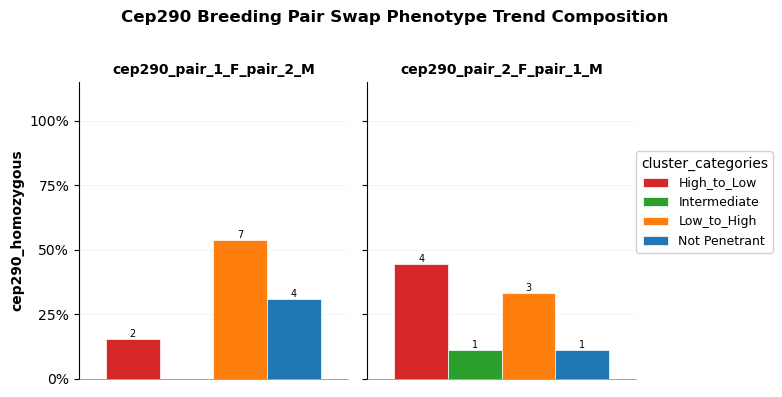

In [49]:


fig_by_genotype = plot_trajectories_faceted(
    df_pair_swap[df_pair_swap["genotype"].str.contains("homozygous")],
    x_col='predicted_stage_hpf',
    y_col='baseline_deviation_normalized',
    col_by='pair',
    row_by="genotype",
    color_by_grouping='cluster_categories',  # NEW API
    color_palette=PHENOTYPE_PALETTE,
    title=f'Trajectories of Cep290 Homozygous Mutants in Pair Swap Experiment',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_pairs_swap_trajectories_colby_colored_homozygous_only_cluster_categories.html'
)

fig_proportion_grid = plot_proportion_faceted(
    df_pair_swap[df_pair_swap["genotype"].str.contains("homozygous")],
    color_by_grouping= "cluster_categories",
    color_palette=PHENOTYPE_PALETTE,
    row_by= "genotype",
    col_by= "pair",
    count_by= 'embryo_id',
    output_path = plot_dir / 'cep290_pairs_swap_homozygous_only_proportion_grid_by_curvature_phenotype_trend.png',
    title = "Cep290 Breeding Pair Swap Phenotype Trend Composition"
)

In [ ]:
df_pairs_1to3["experiment_id"].unique()

In [ ]:
plot_dir = Path('results/mcolon/20251229_cep290_phenotype_extraction/plots_20260107_labmeeting')

os.makedirs(plot_dir, exist_ok=True)


In [ ]:
   plot_trajectories_faceted(
        df_plot,
        x_col=TIME_COL,
        y_col=METRIC_COL,
        line_by="embryo_id",
        row_by="genotype",
        col_by="cluster_category",
        backend=args.backend,
        output_path=(
            out_path if args.backend in {"plotly", "both"} else out_path.with_suffix(".png")
        ),
        title=f"TMEM67 trajectories faceted by genotype × assigned group ({args.assignments.upper()})",
        y_label=METRIC_COL,
        show_individual=True,
        show_error_band=False,
        trend_statistic="median",
        trend_smooth_sigma=1.5,
    )

In [ ]:

# Grouped (side-by-side)
fig_grouped = plot_proportion_grid(
    df[~df["cluster"].isna()],
    col_by='cluster',
    row_by=['genotype', 'pair', 'experiment_id'],
    count_by='embryo_id',
    bar_mode='grouped',
    title=f'Cep290 Cluster Composition',
    output_path=plot_dir / 'cluster_composition_grouped.png',
)


In [ ]:
fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_categories',
    color_by_grouping='cluster_categories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    show_lines = False,
    show_error =True,
    output_path = plot_dir / 'cep290_cluster_trajectories_colby_colored_by_cluster_category_error.html'
)

fig_by_genotype = plot_multimetric_trajectories(
    df[~df["cluster"].isna()],
    metrics=['baseline_deviation_normalized', 'total_length_um'],
    col_by='cluster_subcategories',
    color_by_grouping='cluster_subcategories',  # NEW API
    x_col='predicted_stage_hpf',
    metric_labels={
        'baseline_deviation_normalized': 'Curvature (normalized)',
        'total_length_um': 'Body Length (μm)',
    },
    title=f'Trajectories by Cluster (k=6), Grouped by Genotype',
    x_label='Time (hpf)',
    backend='both',
    bin_width=2.0,
    output_path = plot_dir / 'cep290_cluster_trajectories_colby_colored_by_cluster_subcategory_error.html'
)


/tmp/6204728.1.trapnell-login.q/ipykernel_1056410/283444277.py:3: DtypeWarning: Columns (31,48) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('results/mcolon/20251229_cep290_phenotype_extraction/final_data/embryo_data_with_labels.csv')
